# PROJECT 2: DIAMONDS' PRICE ANALYSIS
## report 1

## EXPLORATORY ANALYSIS OF DATASET
----------------------------------------------
#### INDEX

**1** DIAMONDS CHARACTERISTICS

**2** SUMMARY STATISTICS

**3** EVALUATING OUTLIERS

**4** DISTRIBUTION OF CUANTITATIVE DATA

**5** DISTRIBUTION OF CUALITATIVE DATA

**6** MULTIVARIATE ANALYSIS OF DATASET

Importing packages to work with

In [1]:
import pandas as pd
import numpy as np
import statsmodels

import matplotlib.pyplot as plt
import seaborn as sns
# import cufflinks 
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

from functools import reduce
from operator import iconcat

import warnings

Visualization config 

In [2]:
from IPython.display import HTML
import random

def hide_toggle(for_next=False):
    this_cell = """$('div.cell.code_cell.rendered.selected')"""
    next_cell = this_cell + '.next()'

    toggle_text = 'Toggle show/hide'  # text shown on toggle link
    target_cell = this_cell  # target cell to control with toggle
    js_hide_current = ''  # bit of JS to permanently hide code in current cell (only when toggling next cell)

    if for_next:
        target_cell = next_cell
        toggle_text += ' next cell'
        js_hide_current = this_cell + '.find("div.input").hide();'

    js_f_name = 'code_toggle_{}'.format(str(random.randint(1,2**64)))

    html = """
        <script>
            function {f_name}() {{
                {cell_selector}.find('div.input').toggle();
            }}

            {js_hide_current}
        </script>

        <a href="javascript:{f_name}()">{toggle_text}</a>
    """.format(
        f_name=js_f_name,
        cell_selector=target_cell,
        js_hide_current=js_hide_current, 
        toggle_text=toggle_text
    )

    return HTML(html)

hide_toggle()

In [3]:
# color palettes
['#f94144', '#f3722c', '#f8961e', '#f9c74f', '#90be6d', '#43aa8b', '#577590'] #muted rainbow

cp_oranges = ['#cc5803', '#e2711d', '#ff9505', '#ffb627', '#ffc971'] #oranges gradient
cp_blues = ['#073f57', '#0A5571', '#0C9395', '#0FAF9C', '#10B89F', '#25ECC7', '#61f1d7', '#c5faf0']
cp_blues_2 = ['#48EFEA', '#2981EC', '#2930EC', '#1024B8', '#07154B']

cg_blues = [[np.interp(k, [0,len(cp_blues)-1], [0,1]), val] for k, val in enumerate(cp_blues)]

In [4]:
path_raw_data = '../data/raw/diamonds_train.csv'

diamonds_df = pd.read_csv(path_raw_data)

In [5]:
diamonds_df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,1.21,Premium,J,VS2,62.4,58.0,4268,6.83,6.79,4.25
1,0.32,Very Good,H,VS2,63.0,57.0,505,4.35,4.38,2.75
2,0.71,Fair,G,VS1,65.5,55.0,2686,5.62,5.53,3.65
3,0.41,Good,D,SI1,63.8,56.0,738,4.68,4.72,3.00
4,1.02,Ideal,G,SI1,60.5,59.0,4882,6.55,6.51,3.95


## 1. Características de los Diamantes

The main characteristic of diamonds are set through what is known as the **4 Cs**:

**1. CARAT** It is the most easy metric to evaluate its relationship with price. Carat is the unit of mass commonly used for gemstones and it is equivalent to 0.200grams. The weightier the diamonds, the more expensive it is.
The diamonds' market and customers' preferences are reflected in diamonds' weights distribution throgh the higher production of some specific carats, commonly refered as **magical carats (1.00, 1.50, 2.00)** for which customers are willing to pay far more for a diamonds slighlty over the reference than under it (0.98ct price is much more lower than a 1.01ct one although their weight difference is unto

**2. CUT** It is the most important metric to evaluate the overall quality of the diamond and its beauty. The cut grade scale depend on:

>**2.1 Artistry** Which refers to the quality of the shape and carving of the stone. It can be measured through geometrical ratios and the gemstones proportions.

>**2.2 Apearance** The price difference between two equaly weighted stones with the same Cut grade can be stablished through their differences of how light reflects and refracts inside it. These characteristic are name **fire** and **brilliance**.
- A diamonds fire is the effect caused by diffraction of light as it reflects inside the gemstone.
- Brilliance is the reflexion of white light inside the diamonds. It is highly dependant of its **depth**.
- Scintillation: refers to the flashes of light you can see when you hold a diamond in your hand and move it.

**3. COLOR** The color differences are stablished through a cualitative scale, and differenciates them in two categories:
>**3.1 White Diamonds** Which includes all those with hues variating from cold platinum to warm light-yellow.
The yellower the diamonds, the cheaper it gets; although for the most part of the scale, differences of color are not visible to the naked eye. Coloring also impacts of which metal (gold, white gold etc) is better to showcase the diamonds beauty, therefore it is considered a secondary metric to take into account into pricing.

> **3.2 Fancy Diamonds** Is a category for all those diamonds that come into different colors and that are far more rearer. The array of colors that a diamond could also take are: blue, pink, brown, yellow, red, green and orange.

**4.CLARITY** This grade evaluates purity of the stone. Diamonds can present two types of imperfections:
>**EXTERNAL**: Caused by use and friction with other objects

>**INTERNAL** Usually dued because of natural imperfections during rock formation. There are different types: black spots, clouds and feathers are the most common.


# 2. Get summary statistics of data

### **2.1**  Examination of dataset

In [6]:
print(f'''
SHAPE
Rows in dataset\t\t > \t {diamonds_df.shape[0]}
Columns in dataset\t > \t {diamonds_df.shape[1]}

TYPES OF DATA 
Float columns\t\t > \t {diamonds_df.select_dtypes(include=['float64']).columns.tolist()}
Integer columns\t\t > \t {diamonds_df.select_dtypes(include=['int64']).columns.tolist()}
String columns\t\t > \t {diamonds_df.select_dtypes(include=['object']).columns.tolist()}

NULL
Are there nulls?\t > \t {diamonds_df.isnull().values.any()}

TABLE OF DESCRIPTIVE STATISTICS:
''')

hide_toggle()


SHAPE
Rows in dataset		 > 	 40455
Columns in dataset	 > 	 10

TYPES OF DATA 
Float columns		 > 	 ['carat', 'depth', 'table', 'x', 'y', 'z']
Integer columns		 > 	 ['price']
String columns		 > 	 ['cut', 'color', 'clarity']

NULL
Are there nulls?	 > 	 False

TABLE OF DESCRIPTIVE STATISTICS:



In [7]:
np.around(diamonds_df.describe(), decimals = 3)

,carat,depth,table,price,x,y,z
count,40455.000,40455.000,40455.000,40455.000,40455.000,40455.000,40455.000
mean,0.798,61.753,57.446,3928.444,5.729,5.733,3.537
std,0.476,1.432,2.234,3992.416,1.124,1.147,0.697
min,0.200,43.000,43.000,326.000,0.000,0.000,0.000
25%,0.400,61.000,56.000,945.000,4.710,4.720,2.910
50%,0.700,61.800,57.000,2397.000,5.690,5.710,3.520
75%,1.040,62.500,59.000,5331.000,6.540,6.540,4.035
max,4.500,79.000,95.000,18823.000,10.230,58.900,8.060


**____**

**Insights for data exploration:**

- Dataset doesn't have nulls nor a great variation of datatypes and columns
- Minimun values por geometric columns *x, y, z (%)* are **zero and shouldn't be** because *they're measures*
- Maximum value of *y* is **x6** higher than the rest **[58.90 --> 10.23..8.06]**, therefore it may be interesting to look at outliers

**------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

### 2.3 Remove Outliers Using Interquartile Range *95-5%* and incorrect data

**2.3.1** Remove Outliers Using Interquartile Range *95-5%*

Although the usual IQR range for identifying outliers is 25-75th interquantile. In order not to loose a lot of data, the bounds used to drop outliers are:
- 05th Percentile  - IQR x 1.25
- 95th Percentile + IQR x 1.25

This way, only the most extreme outliers are dropped from EDA.

In [8]:
Q05 = diamonds_df.quantile(0.05)
Q95 = diamonds_df.quantile(0.95)

IQR = Q95 - Q05

In [9]:
# Showing Outliers
diamonds_df[((diamonds_df < (Q05 - 1.25 * IQR)) |(diamonds_df > (Q95 + 1.25 * IQR))).any(axis=1)].shape

(75, 10)

In [10]:
# Dropping Outliers
diamonds_df = diamonds_df[~((diamonds_df < (Q05 - 1.25 * IQR)) |(diamonds_df > (Q95 + 1.25 * IQR))).any(axis=1)]
diamonds_df.shape #40455 - 75 = 40380

(40380, 10)

**2.3.2** Removing data with [x, y, z] == 0

In [11]:
diamonds_df = diamonds_df.loc[~((diamonds_df['x']==0) | (diamonds_df['y']==0) | (diamonds_df['z']==0))]
diamonds_df.shape

(40380, 10)

**____**

**Insights:**

- There are **75 rows with incorrect values** for *x,y or z* which coincidently are outliers inside the 05-95th interquartile.
- Since **its less than 1% of the data available**, I have dropped them from EDA.

**------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

# **2.4** DISTRIBUTION IN NUMERICAL VALUES

In [12]:
diamonds_stats = round(diamonds_df.describe(), 3).transpose()
numeric_cols = diamonds_df.select_dtypes(include=['float64', 'int64']).columns.tolist()
                                     
for col in numeric_cols:
    diamonds_stats.loc[col,'95%'] = np.percentile(diamonds_df[col], 95)
    diamonds_stats.loc[col,'05%'] = np.percentile(diamonds_df[col], 5)

diamonds_stats['IQR'] = diamonds_stats['75%'] - diamonds_stats['25%']

In [13]:
diamonds_stats = np.around(diamonds_stats[['mean', 'std', 'min', '05%', '25%', '50%', '75%', '95%', 'max', 'IQR']], decimals = 3).reset_index()
diamonds_stats.rename(columns={"Index": "COLUMN NAME"})

fig = go.Figure(data=[go.Table(
                header = dict(values = diamonds_stats.columns, 
                              fill_color = cp_blues[1],
                              line_color = cp_blues[5],
                              font = dict(color = cp_blues[5], size=14),
                              align ='center',
                              height=45
                             ),
                 cells = dict(values = [diamonds_stats[k].tolist() for k in diamonds_stats.columns],
                              font=dict(color = cp_blues[1], size=[14, 11]),
                              line_color=['white', cp_blues[5]],
                              fill=dict(color=[cp_blues[5], 'white']),
                              height=30
                             )
                            )
                     ])

fig.update_layout(height=450, width=950, template = 'ggplot2', showlegend=False,
                  title_text="SUMMARY STATISTICS OF NUMERIC FIELDS")

fig.show()

hide_toggle()

In [14]:
config = dict({'displaylogo': False,
               'toImageButtonOptions': {'height': None, 'width': None,},
            })

numeric_violin_traces = {
    1: [['x', 'y', 'z'], [cp_blues[1], cp_blues[1], cp_blues[1]]],
    2: [['depth', 'table'], [cp_blues[2], cp_blues[3]]],
    3: [['carat'], [cp_blues[5]]],
    4: [['price'],[cp_blues[5]]]
                }

fig = make_subplots(rows=1, cols=4, subplot_titles= ('Geometrical Values', 'Proportion Values', 'Weight', 'Price'))

for fg, data in numeric_violin_traces.items():
    for k, val in enumerate(data[0]):
        
        fig.add_trace(go.Violin(y = diamonds_df[data[0][k]], 
                                x0 = data[0][k], 
                                line_color = data[1][k], fillcolor = data[1][k], opacity = 0.5),
                     row = 1, col = fg)

fig.update_layout(height=600, width=950, template = 'ggplot2', showlegend=False,
                  title_text="DATA DISTRIBUTION OF NUMERIC FIELDS")

fig.show(config = config)

hide_toggle()

**____**

**Insights from Numeric Fields distributions:**

There are **4** types of distributions:
> 1. Geometrical values *x,y, z* have pretty much the same distribution along the dataset, being *x and y* very similar, therefore diamonds are very simmetrical in top view.
> - Depth has a Gaussian distribution with *KDE 1 of 61.95% in IQR [59.30, 63.80]*
> - Table's shape indicates that data distribution has a *tendency towards discrete values*
> - Carat and price have a *similar distribution (linear relationship)* taking into consideation that diamond carats tend to aproximate *magical values*


**------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

**POSIBLE SYNTHETIC VARIABLES TO TAKE INTO ACCOUNT**
After research, there are a couple of ratios to further take into consideration to study:
>- Density : mass / volume == 0.2*carat/x*y*z. 
>- Table / Depth : they are usually mentioned as metrics that influence diamonds' beauty.

# **2.5** DISTRIBUTION IN CATEGORICAL VALUES

Label Encoding for Categorical values. Sklearn is not used due to scales that are not obviously ordered

In [15]:
# SORTED STRING CATEGORICAL VALUES
cualitative_scales = {
    'color': np.sort(diamonds_df['color'].unique()).tolist(),
    'clarity': ['IF', 'VVS1', 'VVS2', 'VS1', 'VS2', 'SI1', 'SI2', 'I1'],
    'cut': ['Ideal', 'Premium', 'Very Good', 'Good', 'Fair']
                    }

# FROM STRING TO NUMERICAL
for col,lst in cualitative_scales.items():
    col_to_add = [k+1 for r in diamonds_df[col] for k, val in enumerate(lst) if r == val]
    diamonds_df[f'{col}_num'] = np.array(col_to_add)

In [16]:
# Create dimensions
cut_dim = go.parcats.Dimension(values = diamonds_df['cut'], 
                               categoryorder = 'category ascending', label = "Cut Quality", categoryarray=[0, 1])

color_dim = go.parcats.Dimension(values = diamonds_df['color'], label = "Color Quality")

clarity_dim = go.parcats.Dimension(values = diamonds_df['clarity'], label = "Clarity Quality")

# Create parcats trace
color = diamonds_df['cut_num']

fig = go.Figure(data = [go.Parcats(dimensions=[cut_dim, color_dim, clarity_dim],
                                  line={'color': color, 'colorscale': cg_blues},
                                  hoveron='color', hoverinfo='count+probability')])

fig.show()
hide_toggle()

In [17]:
### DICTIONARIES TO PLOT
list_of_dict = []
for element in ['color', 'cut', 'clarity']:

    a_dict = dict(zip(diamonds_df[element].value_counts().index, diamonds_df[element].value_counts().values))
    dict_to_scatter = dict()

    for val in cualitative_scales[element]:
        dict_to_scatter[val] = a_dict[val]

    list_of_dict.append(dict_to_scatter)

### CONFIG   
config = dict({'displaylogo': False,
               'toImageButtonOptions': {'height': None, 'width': None,},
            })

### FIGURE
fig = make_subplots(rows=1, cols=3, subplot_titles= ('Color Quality', 'Cut Quality', 'Clarity Quality'))

for k, val in enumerate(list_of_dict):
    list_percentages = np.around((list(val.values()) / sum(list(val.values())))*100, 2)
    text_percentages = [f'{num}%' for num in list_percentages[::-1]]
    
    fig.add_trace(go.Scatter(x = list(val.values())[::-1], 
                             y = list(val.keys())[::-1],
                             mode='lines+text', fill = 'tozerox',
                             line = dict(width=0.1, color=cp_blues[1+k]),
                             text = text_percentages,
                             textfont=dict(color="black")),
                             row = 1, col= k+1)


fig.update_layout(height=600, width=950, template = 'ggplot2', showlegend=False,
                  title_text="DATA DISTRIBUTION OF CUALITATIVE FIELDS")

fig.show(config = config)
hide_toggle()


**Color Scales**
D-E-F : Colorless 12.50+18.13+17.74 = 48.37%

**____**

**Insights from Categorial Fields distributions:**

Their distributions are not correlated
There are **4** types of distributions:
> 1. Color quality in dataset concentrates in the four best categories.
> 2. Most data concentrates in the three best categories
> 3. Clarity Quality concentrates in the lower part of the scale

Comparison between distributions shows that the most type of diamond in this data is has:
> - High cut quality
> - Medium color quality
> - Low clarity quality

**------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

# 2.7 Adding data to DF: Volumen / Asimmetry

Since simmetry and size affect price.
Two more columns: 
> - Asimmetry: y/x [%] percentage of difference between measures in different planes. Taking into consideration that the dataset comprises only of round cut diamonds, the measure should be the same for a perfectly simmetrical cut diamond

> - Volume: y*x*z. Taking into consideration as the main geometrical feature for correlation search..

In [18]:
# Asymmetry
diamonds_df['L/W_ratio'] = np.abs(np.around(((diamonds_df['y']*100)/ diamonds_df['x'])-100, 1))

# Volume
diamonds_df['volume'] = np.around((diamonds_df['y']*diamonds_df['x']*diamonds_df['y']), 2)
diamonds_df['V/W_Ratio'] = np.around((diamonds_df['volume']/diamonds_df['carat']), 2)

In [19]:
diamonds_df.head()

,carat,cut,color,clarity,depth,table,price,x,y,z,color_num,clarity_num,cut_num,L/W_ratio,volume,V/W_Ratio
0,1.21,Premium,J,VS2,62.4,58.0,4268,6.83,6.79,4.25,7,5,2,0.6,314.89,260.24
1,0.32,Very Good,H,VS2,63.0,57.0,505,4.35,4.38,2.75,5,5,3,0.7,83.45,260.78
2,0.71,Fair,G,VS1,65.5,55.0,2686,5.62,5.53,3.65,4,4,5,1.6,171.86,242.06
3,0.41,Good,D,SI1,63.8,56.0,738,4.68,4.72,3.00,1,6,4,0.9,104.26,254.29
4,1.02,Ideal,G,SI1,60.5,59.0,4882,6.55,6.51,3.95,4,6,1,0.6,277.59,272.15


# 2.6 Correlation between features

In [20]:
# Correlation Map
diamonds_corr_df = diamonds_df[['L/W_ratio', 'V/W_Ratio', 'volume','depth','table','price','carat','color_num', 'clarity_num', 'cut_num']]\
                                .rename(columns = {'color_num': 'color_quality',
                                                   'clarity_num': 'clarity_quality',
                                                   'cut_num': 'cut_quality'})

In [21]:
corr = diamonds_corr_df.corr()

ff.create_annotated_heatmap(z= corr.values,
                                  x= corr.index.values.tolist(),
                                  y= corr.columns.values.tolist(), 
                                  colorscale = cg_blues,
                                  annotation_text = np.around(corr.values, 2)).show()

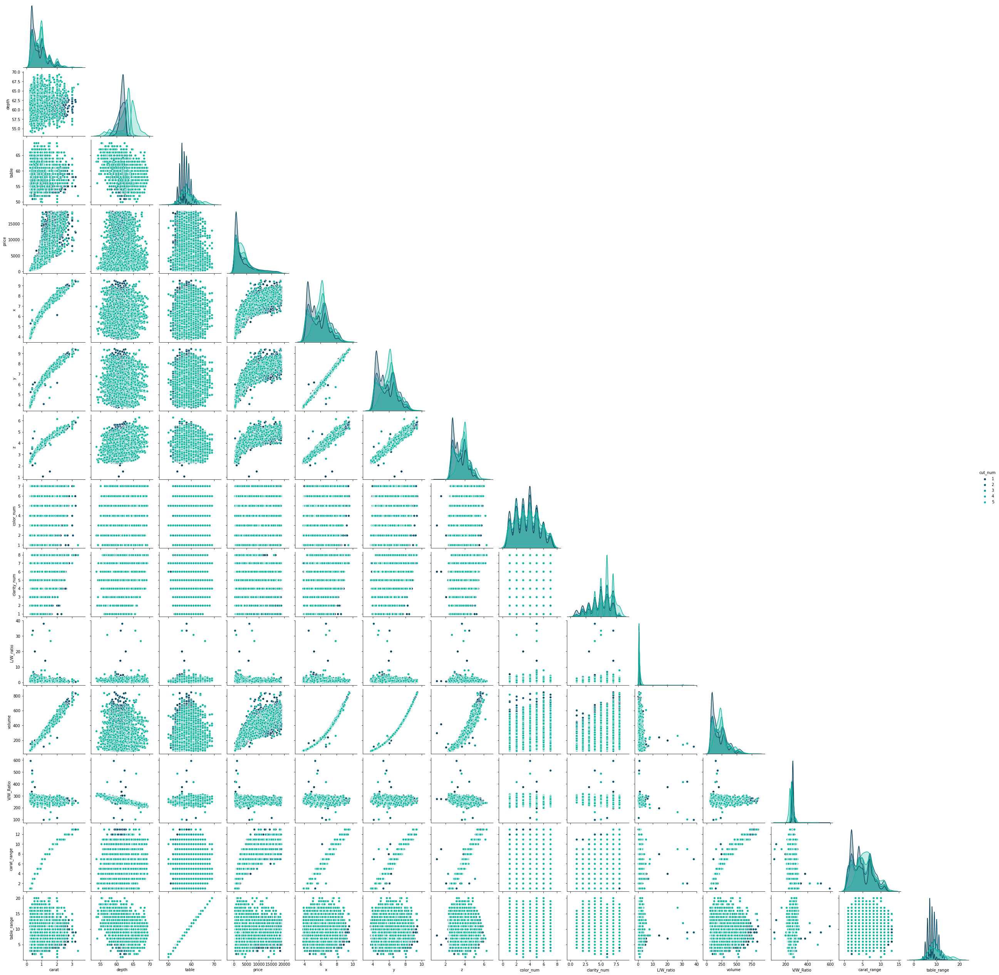

In [28]:
sns.pairplot(data = diamonds_df, hue="cut_num", corner = True, palette = cp_blues)

**____**

**Insights from correlations matrices:**

Linear correlations from matrix:
- The most influencial metric is **carat** that has an exponential relationship with price.

- Other key parameters with similar relationship with price that don't show up in the matrix are:
>- Volume (nearly an identical relationship with carat and price)
>- Geometrical measures (x,y,z)
>- Table

- Relation with Depth and Table could be interesting

- Depth and V/W (density ^-1) have a inverse relationship although scatterplot doesn't really clarify.

- Discrete Scales (cut, color and clarity) have very similar numbers, being the most similar color and clarity

Overall, there are only **4 types of data relationships** in the dataset.

**------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

## ADDING INFORMATION TO DF AND SAVING USEFUL DATA FOR TABLEAU

In [23]:
# USEFUL DICTIONARIES
cualitative_scales = {
    'color': np.sort(diamonds_df['color'].unique()).tolist(),
    'clarity': ['IF', 'VVS1', 'VVS2', 'VS1', 'VS2', 'SI1', 'SI2', 'I1'],
    'cut': ['Ideal', 'Premium', 'Very Good', 'Good', 'Fair']
                    }

# discrete values for carat and table
carat_ranges = {
    1: [0.0, 0.3],     2: [0.3, 0.4],     3: [0.4, 0.5],
    4: [0.5, 0.7],     5: [0.7, 0.9],     6: [0.9, 1.0],
    7: [1.0, 1.2],     8: [1.2, 1.5],     9: [1.5, 1.7],
    10:[1.7, 2.0],     11:[2.0, 2.5],     12:[2.5, 3.0],
    13:[3.0, 4.0]}

#------
table_v1 = set([int(i) for i in sorted(diamonds_df['table'].unique())])
table_v2 = list(table_v1)[1:-1]

table_values = [[v1, v2] for v1, v2 in zip(table_v1, table_v2)]
table_indexes = [k+1 for k, val in enumerate(table_values)]
#------

table_ranges = dict(zip(table_indexes, table_values))

In [24]:
def clasify_color(color):
    if color == 'D' or color == 'E' or color == 'F':
        return 'CL'
    elif color == 'H' or color == 'I' or color == 'G' or color == 'J':
        return 'N-CL'

def clasify_table(table):
    for k, val in table_ranges.items():
        if   val[0] < table <= val[1]:
            return int(k)
        elif table > 68:
            return 20
        elif table < 49:
            return 0

def clasify_carats(carat):
    for k, val in carat_ranges.items():
        if   val[0] < carat <= val[1]:
            return k

In [25]:
# NEW COLUMNS NUMERICAL VALUES AS DISCRETE CATEGORIES
diamonds_df['carat_range'] = diamonds_df['carat'].apply(lambda x: clasify_carats(x))
diamonds_df['table_range'] = diamonds_df['table'].apply(lambda x: clasify_table(x))
diamonds_df['color_range'] = diamonds_df['color'].apply(lambda x: clasify_color(x))

# some values from table are null and floats
diamonds_df = diamonds_df.loc[~(diamonds_df['table_range'].isnull() == True)]
diamonds_df['table_range'] = diamonds_df['table_range'].apply(lambda x: int(x))

# dont need x,y,z values anymore
diamonds_df.drop(['x', 'y', 'z'], axis=1)
diamonds_df.head(2)

,carat,cut,color,clarity,depth,table,price,x,y,z,color_num,clarity_num,cut_num,L/W_ratio,volume,V/W_Ratio,carat_range,table_range,color_range
0,1.21,Premium,J,VS2,62.4,58.0,4268,6.83,6.79,4.25,7,5,2,0.6,314.89,260.24,8,9,N-CL
1,0.32,Very Good,H,VS2,63.0,57.0,505,4.35,4.38,2.75,5,5,3,0.7,83.45,260.78,2,8,N-CL


In [26]:
# final diamonds_clean_df
diamonds_clean_df = diamonds_df[['price', 'carat', 'cut', 'color', 'clarity', 'depth', 'table', 'volume', 'L/W_ratio', 'V/W_Ratio', 'color_num', 'clarity_num', 'cut_num', 'carat_range', 'table_range', 'color_range']]

# saving
path_cleaned_data = '../data/clean/diamonds_cleaned.csv'
diamonds_clean_df.to_csv(path_cleaned_data)

diamonds_clean_df.head()

,price,carat,cut,color,clarity,depth,table,volume,L/W_ratio,V/W_Ratio,color_num,clarity_num,cut_num,carat_range,table_range,color_range
0,4268,1.21,Premium,J,VS2,62.4,58.0,314.89,0.6,260.24,7,5,2,8,9,N-CL
1,505,0.32,Very Good,H,VS2,63.0,57.0,83.45,0.7,260.78,5,5,3,2,8,N-CL
2,2686,0.71,Fair,G,VS1,65.5,55.0,171.86,1.6,242.06,4,4,5,5,6,N-CL
3,738,0.41,Good,D,SI1,63.8,56.0,104.26,0.9,254.29,1,6,4,3,7,CL
4,4882,1.02,Ideal,G,SI1,60.5,59.0,277.59,0.6,272.15,4,6,1,7,10,N-CL


In [27]:
# FINAL CORRELATIONS MATRIX
correlations_array = [[col, index, np.around(corr.loc[index, col], 3)] for col in corr.columns for index in corr.index]
correlations_df = pd.DataFrame.from_records(correlations_array)
correlations_df.rename(columns={0: 'column', 1: 'index', 2: 'data'})

# SAVING IN LOCAL
path_cleaned_data = '../data/clean/diamonds_correlations.csv'
correlations_df.to_csv(path_cleaned_data)

correlations_df.head(5)

,0,1,2
0,L/W_ratio,L/W_ratio,1.000
1,L/W_ratio,V/W_Ratio,-0.077
2,L/W_ratio,volume,-0.003
3,L/W_ratio,depth,0.037
4,L/W_ratio,table,0.107
